In [82]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.model_selection as skm
from sklearn.ensemble import GradientBoostingRegressor as GBR

In [64]:
# load data
df_att = pd.read_csv('attendance data with features.csv')
df_att.head()

,A,LA,H,V,HRk,HAvAge,HGP,HW,HL,HOL,...,ThDAY,FDAY,SDAY,SuDAY,DIV,CAP,LCAP,PA,LPA,LA/LC
0,18411.0,9.820704,Pittsburgh Penguins,Chicago Blackhawks,20.0,31.0,82.0,40.0,31.0,11.0,...,0,0,0,0,0,18387.0,9.819399,1.001305,0.001304,1.000133
1,19092.0,9.857025,Tampa Bay Lightning,Nashville Predators,13.0,29.9,82.0,46.0,30.0,6.0,...,0,0,0,0,0,19092.0,9.857025,1.000000,0.000000,1.000000
2,18724.0,9.837561,Vegas Golden Knights,Seattle Kraken,4.0,29.1,82.0,51.0,22.0,9.0,...,0,0,0,0,1,17367.0,9.762327,1.078137,0.075234,1.007707
3,18893.0,9.846547,Carolina Hurricanes,Ottawa Senators,2.0,29.3,82.0,52.0,21.0,9.0,...,0,0,0,0,0,18700.0,9.836279,1.010321,0.010268,1.001044
4,18145.0,9.806150,Los Angeles Kings,Colorado Avalanche,10.0,28.7,82.0,47.0,25.0,10.0,...,0,0,0,0,0,18230.0,9.810824,0.995337,-0.004674,0.999524


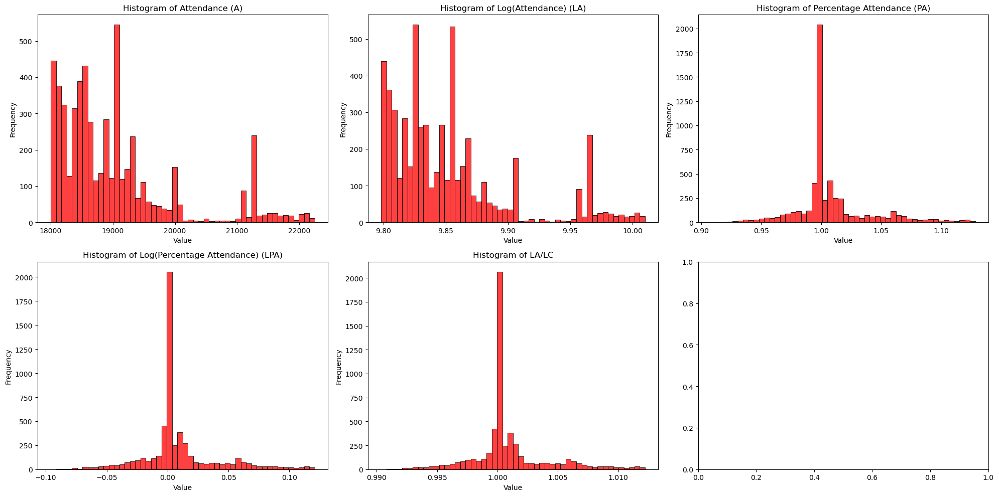

In [105]:
fig, axes = plt.subplots(2, 3, figsize = (20, 10))

columns = ['A', 'LA', 'PA', 'LPA', 'LA/LC']
titles = ['Attendance (A)', 'Log(Attendance) (LA)', 'Percentage Attendance (PA)', 
          'Log(Percentage Attendance) (LPA)', 'LA/LC']
    
for ax, col, title in zip(axes.flat, columns, titles):
    sns.histplot(df_att[col], bins = 50, color = 'red', ax = ax)
    ax.set_title(f'Histogram of {title}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

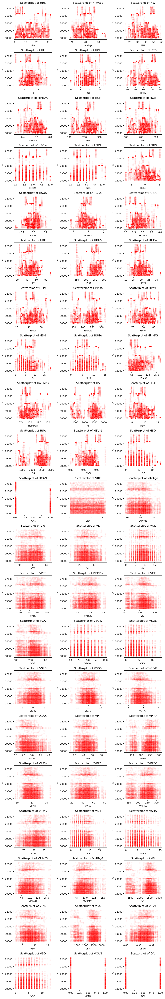

In [73]:
# features to analyze (not A, LA, PA, DA, or non-numeric values)
# some features are really not interesting, lets be honest
# GP: games played
# probably can't extract meaningful information from day-of-week scatter plot visualization (other method)
features = df_att.drop(columns = ['A', 'LA', 'HGP', 
                                  'VGP', 'TDAY', 'WDAY', 
                                  'ThDAY', 'FDAY', 'SDAY', 
                                  'SuDAY', 'PA', 'LPA', 'LA/LC']).select_dtypes(include = [np.number])
features = features.columns.tolist()

# num rows and cols in scatter and boxplots
numrows = 21
numcols = 3

# scatterplots
fig, axes = plt.subplots(nrows = numrows, ncols = numcols, figsize = (10, 60))
for i in range(numrows):
    for j in range(numcols):
        idx = i * numcols + j
        sns.scatterplot(data = df_att, x = features[idx], y = 'A',
                        ax = axes[i, j], color = 'red', alpha = 0.05)
        axes[i, j].set_title(f"Scatterplot of {features[idx]}")
        axes[i, j].set_ylabel('A')
        axes[i, j].set_xlabel(features[idx])

plt.tight_layout()
plt.show()

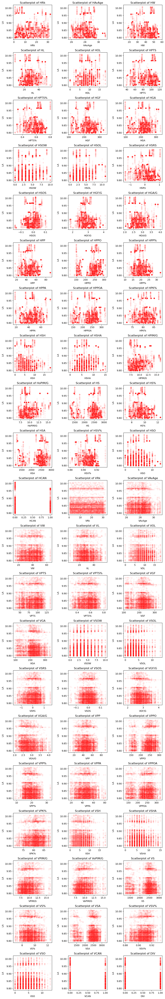

In [74]:
# features to analyze (not A, LA, PA, DA, or non-numeric values)
# some features are really not interesting, lets be honest
# GP: games played
# probably can't extract meaningful information from day-of-week scatter plot visualization (other method)
features = df_att.drop(columns = ['A', 'LA', 'HGP', 
                                  'VGP', 'TDAY', 'WDAY', 
                                  'ThDAY', 'FDAY', 'SDAY', 
                                  'SuDAY', 'PA', 'LPA', 'LA/LC']).select_dtypes(include = [np.number])
features = features.columns.tolist()

# num rows and cols in scatter and boxplots
numrows = 21
numcols = 3

# scatterplots
fig, axes = plt.subplots(nrows = numrows, ncols = numcols, figsize = (10, 60))
for i in range(numrows):
    for j in range(numcols):
        idx = i * numcols + j
        sns.scatterplot(data = df_att, x = features[idx], y = 'LA',
                        ax = axes[i, j], color = 'red', alpha = 0.05)
        axes[i, j].set_title(f"Scatterplot of {features[idx]}")
        axes[i, j].set_ylabel('LA')
        axes[i, j].set_xlabel(features[idx])

plt.tight_layout()
plt.show()

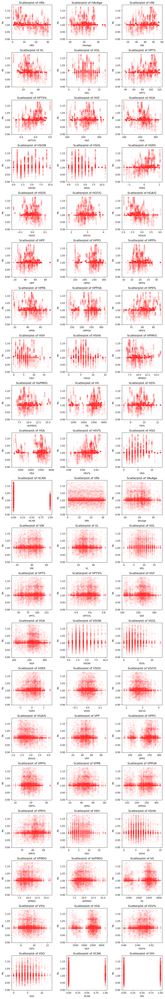

In [77]:
# features to analyze (not A, LA, or non-numeric values)
# some features are really not interesting, lets be honest
# GP: games played
# probably can't extract meaningful information from day-of-week scatter plot visualization (other method)
features = df_att.drop(columns = ['A', 'LA', 'HGP', 
                                  'VGP', 'TDAY', 'WDAY', 
                                  'ThDAY', 'FDAY', 'SDAY', 
                                  'SuDAY', 'PA', 'LPA', 'LA/LC']).select_dtypes(include = [np.number])
features = features.columns.tolist()

# num rows and cols in scatter and boxplots
numrows = 21
numcols = 3

# scatterplots
fig, axes = plt.subplots(nrows = numrows, ncols = numcols, figsize = (10, 60))
for i in range(numrows):
    for j in range(numcols):
        idx = i * numcols + j
        sns.scatterplot(data = df_att, x = features[idx], y = 'PA',
                        ax = axes[i, j], color = 'red', alpha = 0.05)
        axes[i, j].set_title(f"Scatterplot of {features[idx]}")
        axes[i, j].set_ylabel('PA')
        axes[i, j].set_xlabel(features[idx])

plt.tight_layout()
plt.show()

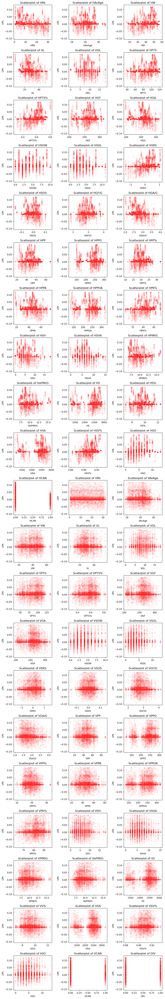

In [75]:
# features to analyze (not A, LA, or non-numeric values)
# some features are really not interesting, lets be honest
# GP: games played
# probably can't extract meaningful information from day-of-week scatter plot visualization (other method)
features = df_att.drop(columns = ['A', 'LA', 'HGP', 
                                  'VGP', 'TDAY', 'WDAY', 
                                  'ThDAY', 'FDAY', 'SDAY', 
                                  'SuDAY', 'PA', 'LPA', 'LA/LC']).select_dtypes(include = [np.number])
features = features.columns.tolist()

# num rows and cols in scatter and boxplots
numrows = 21
numcols = 3

# scatterplots
fig, axes = plt.subplots(nrows = numrows, ncols = numcols, figsize = (10, 60))
for i in range(numrows):
    for j in range(numcols):
        idx = i * numcols + j
        sns.scatterplot(data = df_att, x = features[idx], y = 'LPA',
                        ax = axes[i, j], color = 'red', alpha = 0.05)
        axes[i, j].set_title(f"Scatterplot of {features[idx]}")
        axes[i, j].set_ylabel('LPA')
        axes[i, j].set_xlabel(features[idx])

plt.tight_layout()
plt.show()

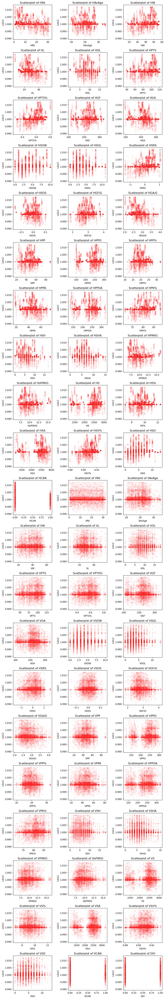

In [76]:
# features to analyze (not A, LA, or non-numeric values)
# some features are really not interesting, lets be honest
# GP: games played
# probably can't extract meaningful information from day-of-week scatter plot visualization (other method)
features = df_att.drop(columns = ['A', 'LA', 'HGP', 
                                  'VGP', 'TDAY', 'WDAY', 
                                  'ThDAY', 'FDAY', 'SDAY', 
                                  'SuDAY', 'PA', 'LPA', 'LA/LC']).select_dtypes(include = [np.number])
features = features.columns.tolist()

# num rows and cols in scatter and boxplots
numrows = 21
numcols = 3

# scatterplots
fig, axes = plt.subplots(nrows = numrows, ncols = numcols, figsize = (10, 60))
for i in range(numrows):
    for j in range(numcols):
        idx = i * numcols + j
        sns.scatterplot(data = df_att, x = features[idx], y = 'LA/LC',
                        ax = axes[i, j], color = 'red', alpha = 0.05)
        axes[i, j].set_title(f"Scatterplot of {features[idx]}")
        axes[i, j].set_ylabel('LA/LC')
        axes[i, j].set_xlabel(features[idx])

plt.tight_layout()
plt.show()

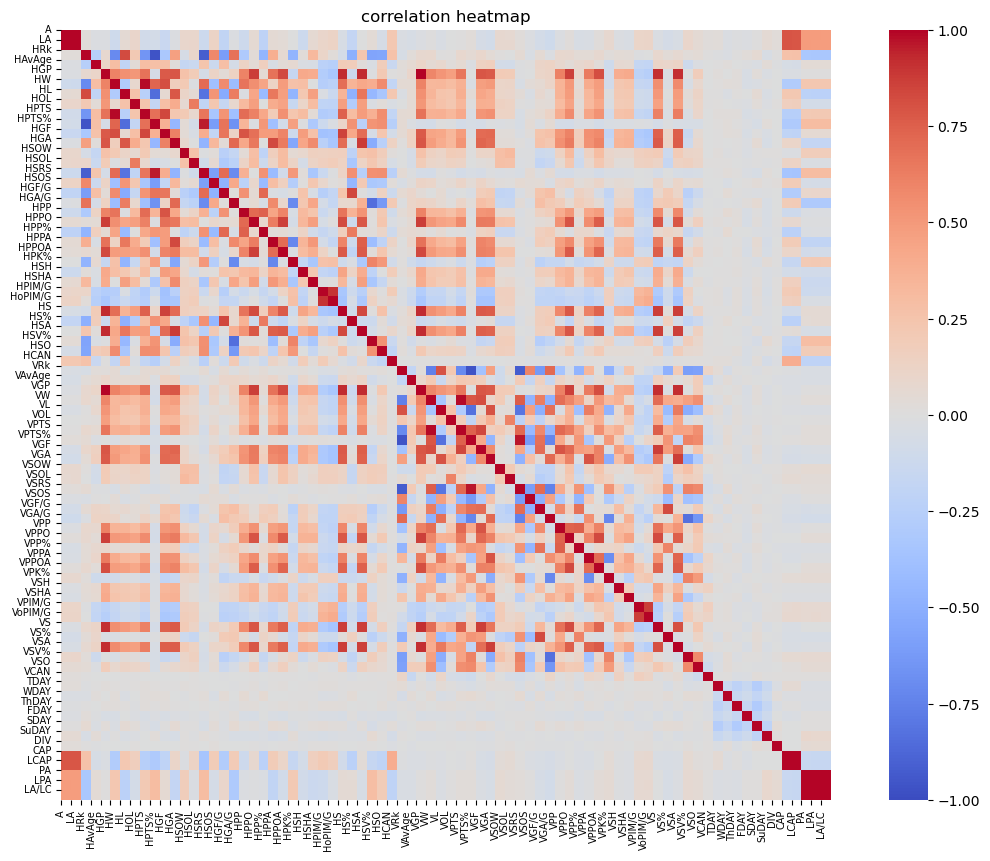

In [69]:
corr_matrix = df_att.drop(columns = ['H', 'V']).corr()

# heatmap of correlation matrix
plt.figure(figsize = (15, 10))
sns.heatmap(corr_matrix, cmap = 'coolwarm', vmin = -1, vmax = 1, square = True)
plt.title('correlation heatmap')
plt.xticks(ticks = range(len(corr_matrix.columns)), labels = corr_matrix.columns, fontsize=7)
plt.yticks(ticks = range(len(corr_matrix.index)), labels = corr_matrix.index, fontsize=7)
plt.show()

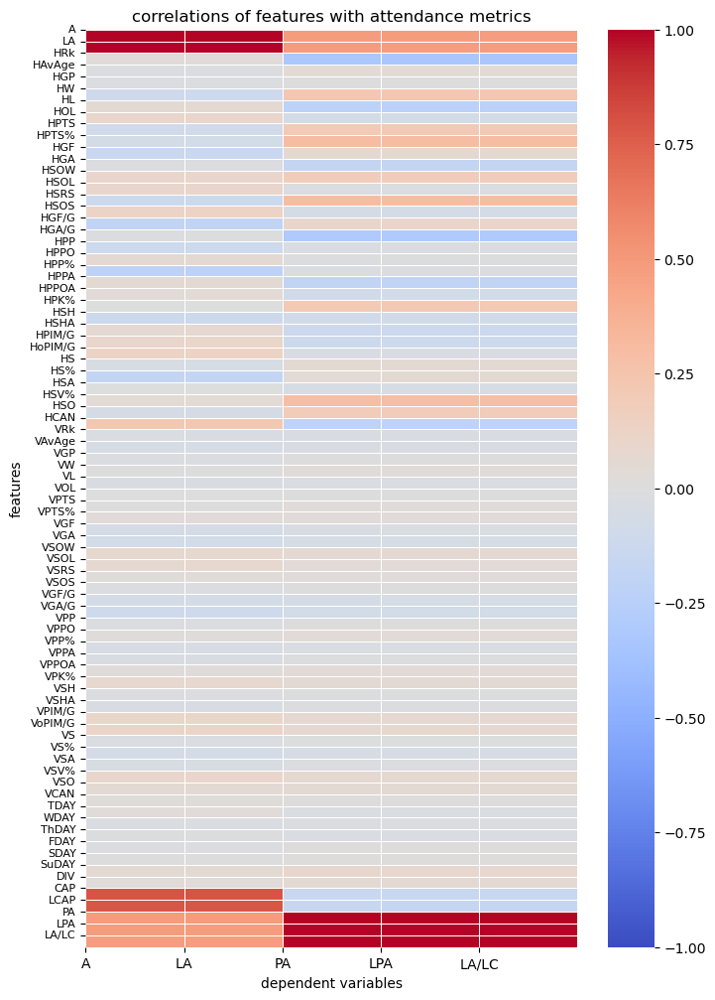

In [100]:
# select only the correlations of all features with the dependent variables
dependent_vars = ['A', 'LA', 'PA', 'LPA', 'LA/LC']
corr_subset = corr_matrix[dependent_vars]

# plot heatmap
plt.figure(figsize = (8, 12))
sns.heatmap(corr_subset, cmap = 'coolwarm', vmin = -1, vmax = 1, linewidths = 0.5)

# labels and formatting
plt.title('correlations of features with attendance metrics')
plt.xlabel('dependent variables')
plt.ylabel('features')
plt.xticks(ticks = range(len(dependent_vars)), labels = dependent_vars, fontsize = 10)
plt.yticks(ticks = range(len(corr_subset.index)), labels = corr_subset.index, fontsize = 8)
plt.show()

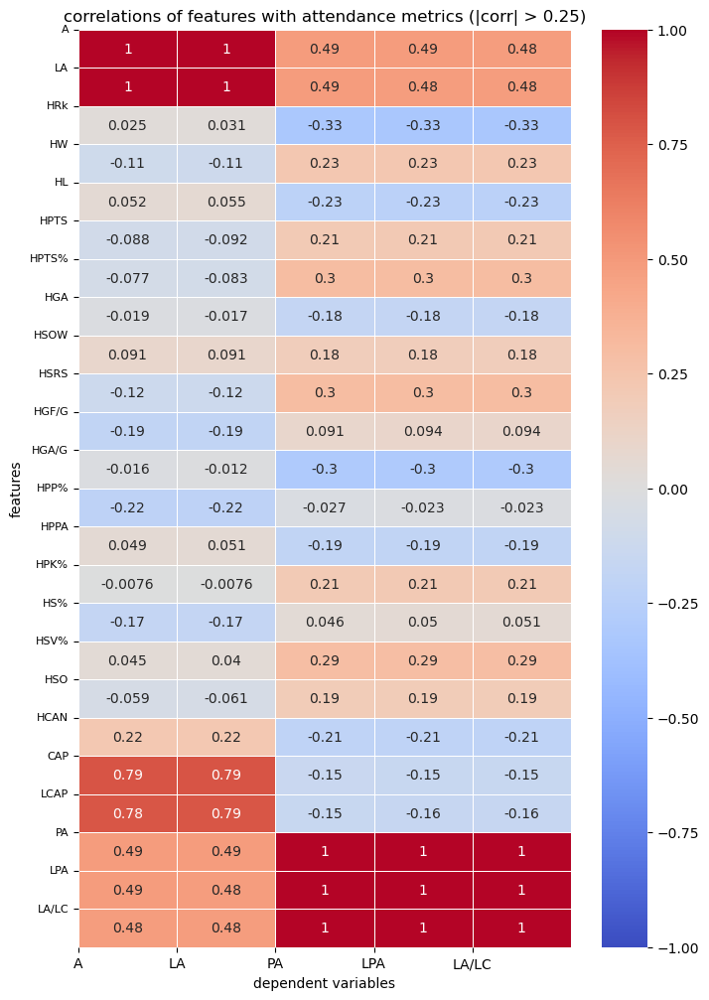

In [104]:
# select only correlations of all features with the dependent variables
dependent_vars = ['A', 'LA', 'PA', 'LPA', 'LA/LC']
corr_subset = corr_matrix[dependent_vars]

# filter: Keep only features where at least one correlation is > 0.25 or < -0.25
filtered_features = corr_subset[(corr_subset.abs() > 0.15).any(axis = 1)]

# plot heatmap with filtered features
plt.figure(figsize = (8, 12))
sns.heatmap(filtered_features, cmap = 'coolwarm', vmin = -1, vmax = 1, annot = True, linewidths = 0.5)

# Labels and formatting
plt.title('correlations of features with attendance metrics (|corr| > 0.25)')
plt.xlabel('dependent variables')
plt.ylabel('features')
plt.xticks(ticks = range(len(dependent_vars)), labels = dependent_vars, fontsize = 10)
plt.yticks(ticks = range(len(filtered_features.index)), labels = filtered_features.index, fontsize = 8)
plt.show()

In [94]:
# use boosted trees to determine feature importances

# create training set (80% of data)
# random seed for reproducability
rand_seed = 34

# size of training set
p = 0.8

# split into training and testing set
train, test = skm.train_test_split(df_att, train_size = p, random_state = rand_seed)

# fit boosting model to training set
# response: attendance (variants), predictors: other
# shrinkage value of 0.01
# using a variable importance measure, determine which predictors
# appear to be the most important

# number of trees (start at 50 cause this might take a while)
n_trees = 500

# shrinkage value
lam = 0.01

dependent_vars = ['A', 'LA', 'PA', 'LPA', 'LA/LC']
feats = ['HRk', 'HAvAge', 'HGP', 'HW', 'HL', 'HOL', 'HPTS', 'HPTS%', 'HGF', 'HGA', 'HSOW',
         'HSOL', 'HSRS', 'HSOS', 'HGF/G', 'HGA/G', 'HPP', 'HPPO', 'HPP%', 'HPPA', 'HPPOA',
         'HPK%', 'HSH', 'HSHA', 'HPIM/G', 'HoPIM/G', 'HS', 'HS%', 'HSA', 'HSV%', 'HSO', 'HCAN',
         'VRk', 'VAvAge', 'VGP', 'VW', 'VL', 'VOL', 'VPTS', 'VPTS%', 'VGF', 'VGA', 'VSOW',
         'VSOL', 'VSRS', 'VSOS', 'VGF/G', 'VGA/G', 'VPP', 'VPPO', 'VPP%', 'VPPA', 'VPPOA',
         'VPK%', 'VSH', 'VSHA', 'VPIM/G', 'VoPIM/G', 'VS', 'VS%', 'VSA', 'VSV%', 'VSO', 'VCAN',
         'TDAY', 'WDAY', 'ThDAY', 'FDAY', 'SDAY', 'SuDAY', 'DIV']

# Create an empty DataFrame to store feature importances
feature_matrix = pd.DataFrame(index = feats)

for dep in dependent_vars:
    # split into response and predictors
    # also remove capacity, because this is obviously one of the biggest indicators
    X_tr = train.drop(columns = dependent_vars + ['H', 'V', 'CAP', 'LCAP'])
    y_tr = train[dep]

    # Fit boosting model
    boost_att = GBR(n_estimators = n_trees, learning_rate = lam, max_depth = 5, random_state = rand_seed)
    boost_att.fit(X_tr, y_tr)

    # Store feature importances
    feature_matrix[dep] = boost_att.feature_importances_

# sort features by overall importance (sum across all dependent variables)
feature_matrix = feature_matrix.loc[feature_matrix.sum(axis = 1).sort_values(ascending = False).index]

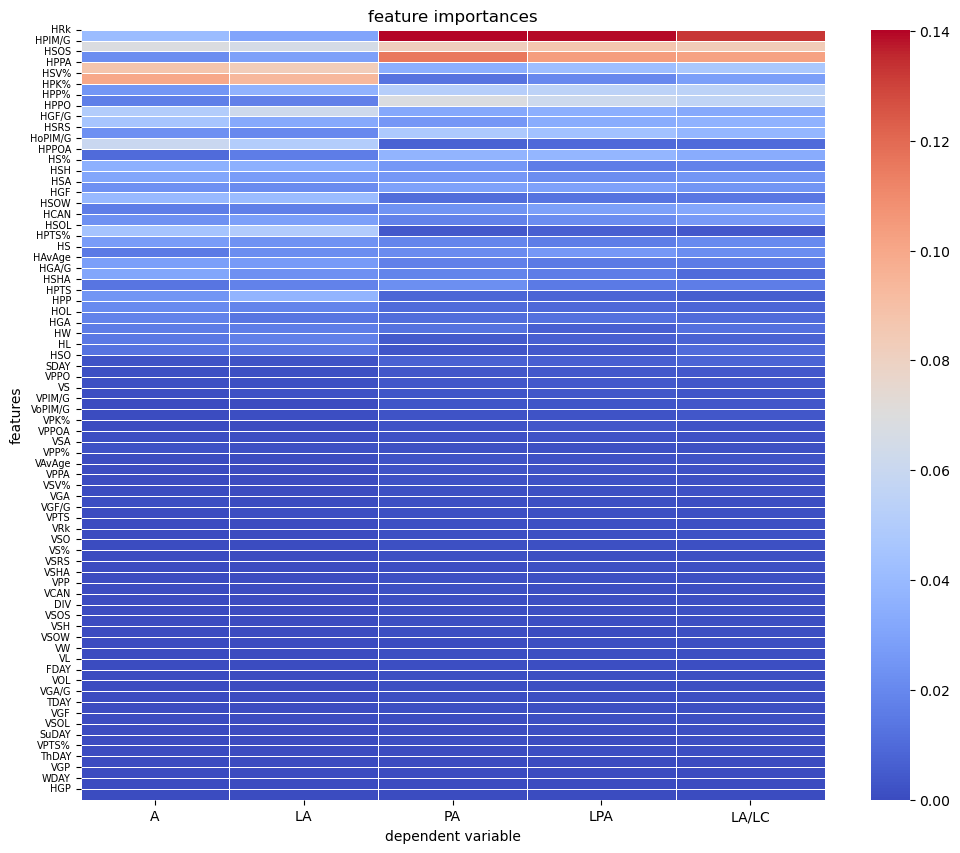

In [96]:
# plot heatmap
plt.figure(figsize = (12, 10))
sns.heatmap(feature_matrix, cmap = "coolwarm", linewidths = 0.5)
plt.title('feature importances')
plt.xlabel('dependent variable')
plt.ylabel('features')
plt.yticks(ticks = range(len(feature_matrix.index)), labels = feature_matrix.index, fontsize = 7)
plt.show()